In [1]:
import os
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_predict
from sklearn.metrics import accuracy_score, classification_report
from skimage.feature import graycomatrix, graycoprops
from scipy.stats import entropy
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
from sklearn.metrics import (confusion_matrix, ConfusionMatrixDisplay)
import seaborn as sns
from tqdm import tqdm
from rembg import remove

c:\Users\asusv\anaconda3\Lib\site-packages\paramiko\pkey.py:82: CryptographyDeprecationWarning: TripleDES has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.TripleDES and will be removed from this module in 48.0.0.
  "cipher": algorithms.TripleDES,
c:\Users\asusv\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.Blowfish and will be removed from this module in 45.0.0.
  "class": algorithms.Blowfish,
c:\Users\asusv\anaconda3\Lib\site-packages\paramiko\transport.py:243: CryptographyDeprecationWarning: TripleDES has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.TripleDES and will be removed from this module in 48.0.0.
  "class": algorithms.TripleDES,


In [2]:
data = []
labels = []
file_name = []
for sub_folder in os.listdir("dataset\\"):
    sub_folder_files = os.listdir(os.path.join("dataset\\", sub_folder))
    for i, filename in enumerate(sub_folder_files):
        img_path = os.path.join("dataset\\", sub_folder, filename)
        img = plt.imread(img_path)
        
        data.append(img)
        labels.append(sub_folder)
        name = os.path.splitext(filename)[0]
        file_name.append(filename)
        
data = np.array(data)
labels = np.array(labels)


In [3]:
# melakukan augmentasi data
data_augmented = []
labels_augmented = []
paths_augmented = []
file_name_augmented = []
for i in range(len(data)):
	pass


In [4]:

print("Data sebelum augmentasi: ", len(data))
print("Data setelah augmentasi: ", len(data_augmented))


Data sebelum augmentasi:  300
Data setelah augmentasi:  0


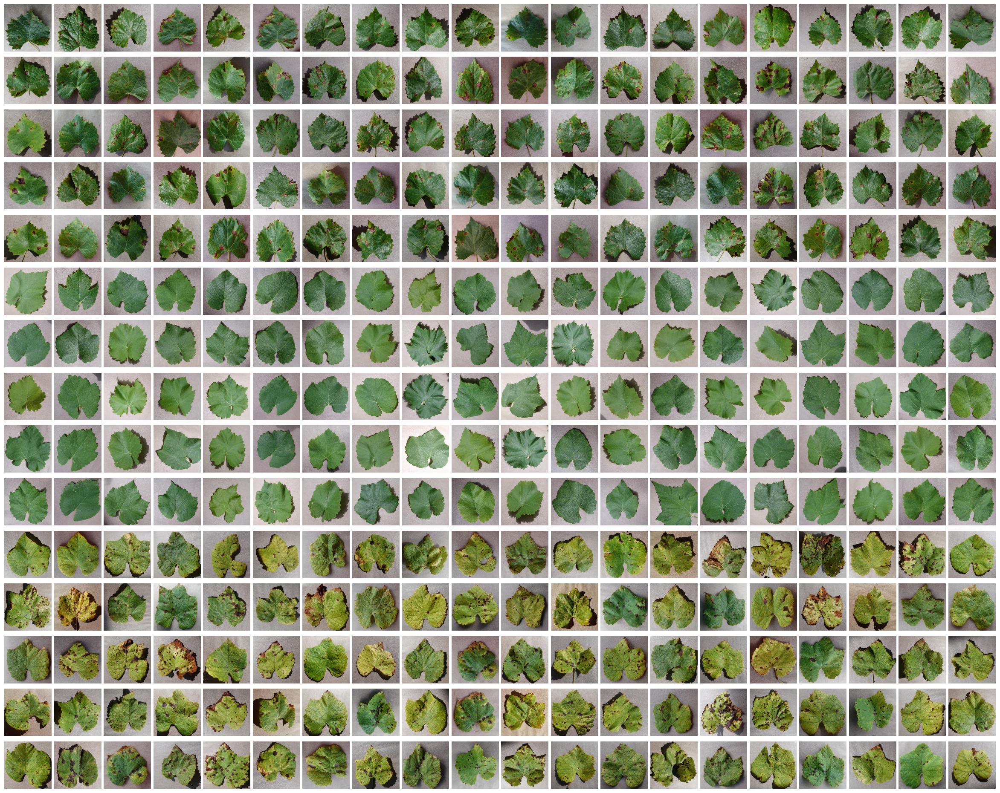

In [5]:

max_display = 400
display_data = data[:max_display]

columns = 20
total = len(display_data)
rows = -(-total // columns)

fig, axes = plt.subplots(nrows=rows, ncols=columns, figsize=(30, 24))

axes_list = axes.ravel() if total > 1 else [axes]

for idx in range(rows * columns):
    ax = axes_list[idx]
    if idx < total:
        ax.imshow(display_data[idx])
    ax.axis('off')

plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()


In [6]:

# Siapkan dictionary kosong
data_kategori = {}

# Bangun struktur kategori -> list of (filename, image)
for img, label, fname in zip(data, labels, file_name):
    if label not in data_kategori:
        data_kategori[label] = []
    data_kategori[label].append((fname, img))  # (filename, image)


In [7]:
def removeBackgroundByCategory(data):
    removed_data = {}
    for kategori, items in data.items():
        removed_list = []
        for filename, img in tqdm(items, desc=f"remove background {kategori}"):
            img_removed = remove(img)
            removed_list.append((filename, img_removed))
        removed_data[kategori] = removed_list
    return removed_data

In [8]:

# 4. Fungsi grayscaling
def gray_scaling(data):
    gray_data = {}
    for kategori, items in data.items():
        gray_list = []
        for filename, img in tqdm(items, desc=f"grayscaling {kategori}"):
            gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
            gray_list.append((filename, gray))  
        gray_data[kategori] = gray_list
    return gray_data

In [9]:
# 5. Jalankan proses
removej = removeBackgroundByCategory(data_kategori)
grayj = gray_scaling(removej)



remove background Grape___healthy: 100%|██████████| 100/100 [01:59<00:00,  1.20s/it]
remove background Grape___Leaf_blight_(Isariopsis_Leaf_Spot): 100%|██████████| 100/100 [02:02<00:00,  1.22s/it]
grayscaling Grape___healthy: 100%|██████████| 100/100 [00:00<00:00, 10388.11it/s]
grayscaling Grape___Leaf_blight_(Isariopsis_Leaf_Spot): 100%|██████████| 100/100 [00:00<00:00, 11623.40it/s]


Kategori: Grape___Black_rot


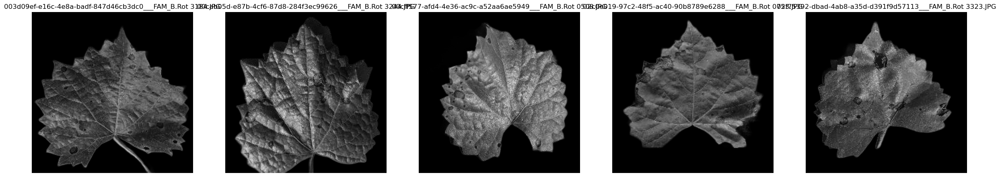

Kategori: Grape___healthy


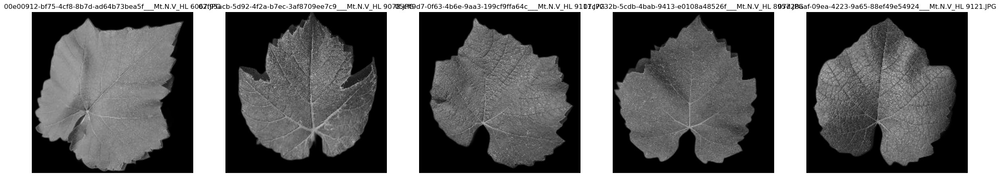

Kategori: Grape___Leaf_blight_(Isariopsis_Leaf_Spot)


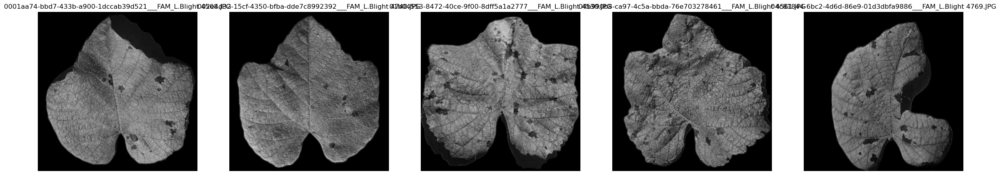

In [10]:

n_display = 5

for kategori, items in grayj.items():
    print(f"Kategori: {kategori}")
    plt.figure(figsize=(30, 15))
    
    for i, (filename, img) in enumerate(items[:n_display]):
        plt.subplot(1, n_display, i+1)
        plt.imshow(cv.cvtColor(img, cv.COLOR_BGRA2RGBA))
        plt.title(filename)
        plt.axis('off')
    
    plt.show()

In [11]:

def resize(img, th, tw):
    h, w = img.shape
    resized = np.zeros((th, tw), dtype=np.uint8)
    skala_y = h / th
    skala_x = w / tw
    for i in range(th):
        for j in range(tw):
            src_y = int(i * skala_y)
            src_x = int(j * skala_x)
            resized[i, j] = img[src_y, src_x]
    return resized

# Normalisasi citra
def normalisasi(img):
    min_val = np.min(img)
    max_val = np.max(img)
    if max_val - min_val == 0:
        return np.zeros_like(img, dtype=np.uint8)
    normalized_img = ((img - min_val) / (max_val - min_val)) * 255
    return normalized_img.astype(np.uint8)

# Ekualisasi histogram
def ekualisasi(img):
    hist = np.zeros(256, dtype=int)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            hist[img[i, j]] += 1
    total_pixels = img.shape[0] * img.shape[1]
    pdf = hist / total_pixels
    cdf = np.zeros(256)
    cdf[0] = pdf[0]
    for i in range(1, 256):
        cdf[i] = cdf[i - 1] + pdf[i]
    cdf_normalized = np.round(cdf * 255).astype(np.uint8)
    ekualisasi_img = np.zeros_like(img)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            ekualisasi_img[i, j] = cdf_normalized[img[i, j]]
    return ekualisasi_img

# Histogram
def histogram(frag):
    hist = np.zeros(256)
    img_flat = frag.flatten()
    for i in img_flat:
        hist[i] += 1
    hist_y = hist
    hist_x = np.arange(0, len(hist))
    return hist_y, hist_x

# Spesifikasi histogram
def spesifikasi(img, img_ref):
    hist_input = histogram(img)
    hist_ref = histogram(img_ref)
    cdf_input = np.cumsum(hist_input) / np.sum(hist_input)
    cdf_ref = np.cumsum(hist_ref) / np.sum(hist_ref)
    map_hist = np.zeros(256, dtype=np.uint8)
    for i in range(256):
        selisih = np.abs(cdf_input[i] - cdf_ref)
        map_hist[i] = np.argmin(selisih)
    hasil = map_hist[img]
    return hasil

# Konvolusi biasa
def konvo(img, kernel):
    img_h, img_w = img.shape
    kernel_h, kernel_w = kernel.shape
    pad_h = kernel_h // 2
    pad_w = kernel_w // 2
    pad_img = np.pad(img, ((pad_h, pad_h), (pad_w, pad_w)), mode='edge')
    result = np.zeros([img_h, img_w])
    for i in range(img_h):
        for j in range(img_w):
            result[i, j] = np.sum(pad_img[i:i+kernel_h, j:j+kernel_w] * kernel)
    result = (result - result.min()) / (result.max() - result.min()) * 255
    return result.astype(np.uint8)

# Operasi modus dan median
def op_modus(piksel_values):
    count = {}
    for num in piksel_values:
        count[num] = count.get(num, 0) + 1
    modus = max(count, key=count.get)
    return modus

def op_median(piksel_values):
    n = len(piksel_values)
    sorted_piksel = sorted(piksel_values)
    if n % 2 == 0:
        median1 = sorted_piksel[n//2]
        median2 = sorted_piksel[n//2-1]
        median = (median1 + median2)/2
    else:
        median = sorted_piksel[n//2]
    return median

# Konvolusi median/modus
def konvo_modmed(img, kernel, jenis):
    img_h, img_w = img.shape
    kernel_h, kernel_w = kernel.shape
    pad_h = kernel_h // 2
    pad_w = kernel_w // 2
    pad_img = np.pad(img, ((pad_h, pad_h), (pad_w, pad_w)), mode='edge')
    result = np.zeros_like(img)
    for i in range(img_h):
        for j in range(img_w):
            temp = []
            for k in range(kernel_h):
                for l in range(kernel_w):
                    temp.append(pad_img[i + k, j + l])
            if jenis == "modus":
                result[i, j] = op_modus(temp)
            else:
                result[i, j] = op_median(temp)
    return result.astype(np.uint8)

# Padding khusus Roberts
def padding_baris(img):
    h, w = img.shape
    img_pad = np.zeros((h, w + 1))
    for i in range(h):
        for j in range(w):
            img_pad[i][j] = img[i][j]
    return img_pad

def padding_kolom(img):
    h, w = img.shape
    img_pad = np.zeros((h + 1, w))
    for i in range(h):
        for j in range(w):
            img_pad[i][j] = img[i][j]
    return img_pad

# Konvolusi khusus edge
def konvo_edge(img, kernel, jenis):
    img_h, img_w = img.shape
    kernel_h, kernel_w = kernel.shape
    pad_h = kernel_h // 2
    pad_w = kernel_w // 2
    if jenis != "roberts":
        padded_img = np.pad(img, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant')
    else:
        padded_img = padding_kolom(padding_baris(img))
    result = np.zeros([img_h, img_w])
    for i in range(img_h):
        for j in range(img_w):
            result[i, j] = np.sum(padded_img[i:i+kernel_h, j:j+kernel_w] * kernel)
    return result

# Edge detection
def edge(image, kernelX, kernelY, jenis):
    gradX = konvo_edge(image, kernelX, jenis)
    gradY = konvo_edge(image, kernelY, jenis)
    M = np.sqrt((gradX * gradX) + (gradY * gradY))
    return M.astype(np.uint8)

# Thresholding
def threshold(img, batas):
    hasil = np.copy(img)
    hasil[hasil >= batas] = 0
    hasil[hasil < batas] = 255
    return hasil

# Morfologi
def erosi(img, kernel):
    h, w = img.shape
    kernel_h, kernel_w = kernel.shape
    center = kernel_h // 2
    hasil = np.zeros((h, w))
    for i in range(center, h - center):
        for j in range(center, w - center):
            cocok = True
            for x in range(kernel_h):
                for y in range(kernel_w):
                    if kernel[x, y] == 1 and img[i + x - center, j + y - center] == 0:
                        cocok = False
                        break
                if not cocok:
                    break
            if cocok:
                hasil[i, j] = 255
    return hasil

def dilasi(img, kernel):
    h, w = img.shape
    kernel_h, kernel_w = kernel.shape
    center = kernel_h // 2
    hasil = np.zeros((h, w))
    for i in range(center, h - center):
        for j in range(center, w - center):
            if img[i, j] == 255:
                for x in range(kernel_h):
                    for y in range(kernel_w):
                        if kernel[x, y] == 1:
                            hasil[i + x - center, j + y - center] = 255
            else:
                if hasil[i, j] != 255:
                    hasil[i, j] = 0
    return hasil

def opening(img, kernel):
    return dilasi(erosi(img, kernel), kernel)

def closing(img, kernel):
    return erosi(dilasi(img, kernel), kernel)

def gradien_morph(img, kernel):
    return dilasi(img, kernel) - erosi(img, kernel)

# Kernel morfologi dan filter
kernel3x3_empty = np.ones((3, 3), dtype=np.uint8)
kernel_smooth = np.array([[1/10, 1/10, 1/10], [1/10, 1/5, 1/10], [1/10, 1/10, 1/10]])
kernel_sharp = np.array([[1/9, 1/9, 1/9], [1/9, 8/9, 1/9], [1/9, 1/9, 1/9]])

# Kernel Sobel
Sx = np.array([[-1, 0, 1],
               [-2, 0, 2],
               [-1, 0, 1]])

Sy = np.array([[1, 2, 1],
               [0, 0, 0],
               [-1, -2, -1]])


In [12]:

data = []

for items in grayj.values():
    for _, img in items:
        data.append(img)

In [13]:
dataPreprocessed = []
for i in range(len(data)): # Loop through each image and do preprocessing
	img = data[i]
	img = resize(img, 128, 128)
	img = normalisasi(img)
	img = edge(img, Sx, Sy, "sobel")


	dataPreprocessed.append(img)

	

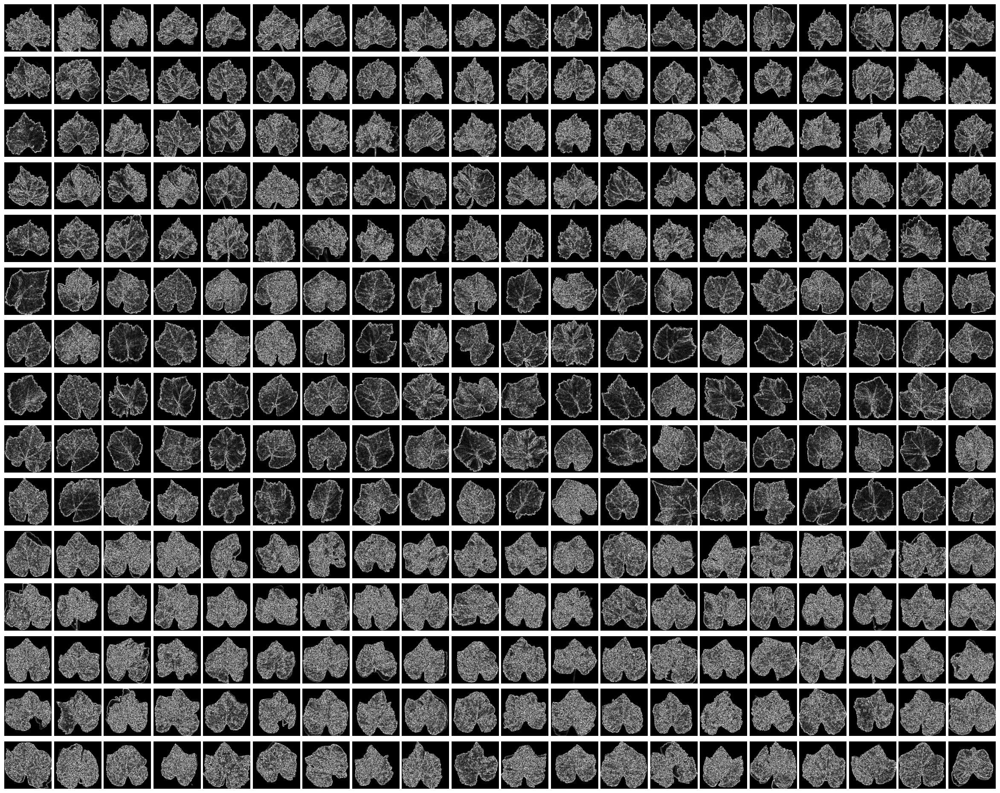

In [14]:

max_display = 400
display_data = dataPreprocessed[:max_display]

columns = 20
total = len(display_data)
rows = -(-total // columns)

fig, axes = plt.subplots(nrows=rows, ncols=columns, figsize=(30, 24))

axes_list = axes.ravel() if total > 1 else [axes]

for idx in range(rows * columns):
    ax = axes_list[idx]
    if idx < total:
        ax.imshow(display_data[idx], cmap='gray')
    ax.axis('off')

plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()

In [15]:
def glcm(image, derajat):
    if derajat == 0:
        angles = [0]
    elif derajat == 45:
        angles = [np.pi / 4]
    elif derajat == 90:
        angles = [np.pi / 2]
    elif derajat == 135:
        angles = [3 * np.pi / 4]
    else:
        raise ValueError("Invalid angle. It should be one of the following: 0, 45, 90, 135.")
    
    # mengembalikan matrix glcm dari image
    glcm = graycomatrix(image, [1], angles, 256, symmetric=True, normed=True)
    return glcm


In [16]:

def correlation(matriks):
	return graycoprops(matriks, 'correlation')[0, 0]


In [17]:

def dissimilarity(matriks):
    return graycoprops(matriks, 'dissimilarity')[0, 0]


In [18]:

def homogenity(matriks):
    return graycoprops(matriks, 'homogeneity')[0, 0]


In [19]:

def contrast(matriks):
    return graycoprops(matriks, 'contrast')[0, 0]


In [20]:

def ASM(matriks):
    return graycoprops(matriks, 'ASM')[0, 0]


In [21]:
def energy(matriks):
    return graycoprops(matriks, 'energy')[0, 0]

In [22]:
def entropyGlcm(matriks):
    return entropy(matriks.ravel())


In [23]:
Derajat0 = []
Derajat45 = []
Derajat90 = []
Derajat135 = []
for i in range(len(dataPreprocessed)):
    D0 = glcm(dataPreprocessed[i], 0)
    D45 = glcm(dataPreprocessed[i], 45)
    D90 = glcm(dataPreprocessed[i], 90)
    D135 = glcm(dataPreprocessed[i], 135)
    Derajat0.append(D0)
    Derajat45.append(D45)
    Derajat90.append(D90)
    Derajat135.append(D135)


In [24]:

Kontras0, Kontras45, Kontras90, Kontras135 = [], [], [], []
dissimilarity0, dissimilarity45, dissimilarity90, dissimilarity135 =  [], [], [], []
homogenity0, homogenity45, homogenity90, homogenity135 = [], [], [], []
entropy0, entropy45, entropy90, entropy135 =  [], [], [], []
ASM0, ASM45, ASM90, ASM135 =  [], [], [], []
energy0, energy45, energy90, energy135 =  [], [], [], []
correlation0, correlation45, correlation90, correlation135 = [], [], [], []


In [25]:


for i in range(len(dataPreprocessed)):
    C0 = correlation(Derajat0[i])
    correlation0.append(C0)
    C45 = correlation(Derajat45[i])
    correlation45.append(C45)
    C90 = correlation(Derajat90[i])
    correlation90.append(C90)
    C135 = correlation(Derajat135[i])
    correlation135.append(C135)


In [26]:

for i in range(len(dataPreprocessed)):
    K0 = contrast(Derajat0[i])
    K45 = contrast(Derajat45[i])
    K90 = contrast(Derajat90[i])
    K135 = contrast(Derajat135[i])
    Kontras0.append(K0)
    Kontras45.append(K45)
    Kontras90.append(K90)
    Kontras135.append(K135)


In [27]:

for i in range(len(dataPreprocessed)):
    Dis0 = dissimilarity(Derajat0[i])
    Dis45 = dissimilarity(Derajat45[i])
    Dis90 = dissimilarity(Derajat90[i])
    Dis135 = dissimilarity(Derajat135[i])
    dissimilarity0.append(Dis0)
    dissimilarity45.append(Dis45)
    dissimilarity90.append(Dis90)
    dissimilarity135.append(Dis135)


In [28]:

for i in range(len(dataPreprocessed)):
    H0 = homogenity(Derajat0[i])
    H45 = homogenity(Derajat45[i])
    H90 = homogenity(Derajat90[i])
    H135 = homogenity(Derajat135[i])
    homogenity0.append(H0)
    homogenity45.append(H45)
    homogenity90.append(H90)
    homogenity135.append(H135)


In [29]:

for i in range(len(dataPreprocessed)):  
    E0 = entropyGlcm(Derajat0[i])
    E45 = entropyGlcm(Derajat45[i])
    E90 = entropyGlcm(Derajat90[i])
    E135 = entropyGlcm(Derajat135[i])
    entropy0.append(E0)
    entropy45.append(E45)
    entropy90.append(E90)
    entropy135.append(E135)


In [30]:

for i in range(len(dataPreprocessed)):
    A0 = ASM(Derajat0[i])
    A45 = ASM(Derajat45[i])
    A90 = ASM(Derajat90[i])
    A135 = ASM(Derajat135[i])
    ASM0.append(A0)
    ASM45.append(A45)
    ASM90.append(A90)
    ASM135.append(A135)


In [31]:

for i in range(len(dataPreprocessed)):
    ER0 = energy(Derajat0[i])
    ER45 = energy(Derajat45[i])
    ER90 = energy(Derajat90[i])
    ER135 = energy(Derajat135[i])
    energy0.append(ER0)
    energy45.append(ER45)
    energy90.append(ER90)
    energy135.append(ER135)


In [32]:

print("Filename:", len(file_name))
print("Label:", len(labels))
print("Kontras0:", len(Kontras0))
print("Kontras45:", len(Kontras45))
print("Kontras90:", len(Kontras90))
print("Kontras135:", len(Kontras135))
print("Homogeneity0:", len(homogenity0))
print("Homogeneity45:", len(homogenity45))
print("Homogeneity90:", len(homogenity90))
print("Homogeneity135:", len(homogenity135))
print("Entropy0:", len(entropy0))
print("Entropy45:", len(entropy45))
print("Entropy90:", len(entropy90))
print("Entropy135:", len(entropy135))
print("Correlation0:", len(correlation0))
print("Correlation45:", len(correlation45))
print("Correlation90:", len(correlation90))
print("Correlation135:", len(correlation135))

Filename: 300
Label: 300
Kontras0: 300
Kontras45: 300
Kontras90: 300
Kontras135: 300
Homogeneity0: 300
Homogeneity45: 300
Homogeneity90: 300
Homogeneity135: 300
Entropy0: 300
Entropy45: 300
Entropy90: 300
Entropy135: 300
Correlation0: 300
Correlation45: 300
Correlation90: 300
Correlation135: 300


In [33]:
dataTable = {'Filename': file_name, 'Label': labels,
        'Contrast0': Kontras0, 'Contrast45': Kontras45, 'Contrast90': Kontras90, 'Contrast135': Kontras135,
        'Homogeneity0': homogenity0, 'Homogeneity45': homogenity45, 'Homogeneity90': homogenity90, 'Homogeneity135': homogenity135,
        'Dissimilarity0': dissimilarity0, 'Dissimilarity45': dissimilarity45, 'Dissimilarity90': dissimilarity90, 'Dissimilarity135': dissimilarity135,
        'Entropy0': entropy0, 'Entropy45': entropy45, 'Entropy90': entropy90, 'Entropy135': entropy135,
        'ASM0': ASM0, 'ASM45': ASM45, 'ASM90': ASM90, 'ASM135': ASM135,
        'Energy0': energy0, 'Energy45': energy45, 'Energy90': energy90, 'Energy135': energy135,
        'Correlation0': correlation0, 'Correlation45': correlation45, 'Correlation90': correlation90, 'Correlation135': correlation135,
        }
df = pd.DataFrame(dataTable)
df.to_csv('hasil_ekstraksi_3.csv', index=False)

hasilEkstrak = pd.read_csv('hasil_ekstraksi_3.csv')
hasilEkstrak

,Filename,Label,Contrast0,Contrast45,Contrast90,Contrast135,Homogeneity0,Homogeneity45,Homogeneity90,Homogeneity135,...,ASM90,ASM135,Energy0,Energy45,Energy90,Energy135,Correlation0,Correlation45,Correlation90,Correlation135
0,003d09ef-e16c-4e8a-badf-847d46cb3dc0___FAM_B.R...,Grape___Black_rot,3773.412402,4345.484345,4100.262365,4469.384153,0.408853,0.400357,0.408135,0.397039,...,0.153126,0.145498,0.390580,0.383053,0.391313,0.381443,0.625955,0.570112,0.593549,0.557855
1,00cab05d-e87b-4cf6-87d8-284f3ec99626___FAM_B.R...,Grape___Black_rot,4494.053765,4746.444169,4372.769316,4985.584971,0.345607,0.335398,0.348262,0.335057,...,0.107643,0.101263,0.325694,0.317917,0.328090,0.318219,0.590251,0.566884,0.600686,0.545062
2,00cff577-afd4-4e36-ac9c-a52aa6ae5949___FAM_B.R...,Grape___Black_rot,3408.648376,3687.153078,3314.720349,3812.515221,0.470045,0.458537,0.470537,0.459025,...,0.194188,0.184652,0.439691,0.430648,0.440668,0.429712,0.655547,0.628554,0.665039,0.615925
3,02c0e019-97c2-48f5-ac40-90b8789e6288___FAM_B.R...,Grape___Black_rot,2546.592028,3165.835700,2992.660064,3242.092256,0.517681,0.507564,0.516613,0.507996,...,0.252383,0.244769,0.501950,0.494805,0.502377,0.494742,0.713653,0.645306,0.663495,0.636762
4,02f75392-dbad-4ab8-a35d-d391f9d57113___FAM_B.R...,Grape___Black_rot,2691.556718,3157.492963,2654.006275,3007.171182,0.527063,0.517170,0.526981,0.518816,...,0.261870,0.253878,0.511423,0.504045,0.511732,0.503863,0.672829,0.617708,0.677394,0.635908
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,4cd25f42-7cda-4507-a1bd-a03b5f439ef5___FAM_L.B...,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),5000.013656,5269.323703,4680.348302,5304.000248,0.293660,0.285505,0.298404,0.286574,...,0.077855,0.072138,0.275088,0.268020,0.279024,0.268586,0.532672,0.507641,0.562926,0.504401
296,4d7ad495-1420-4ac7-9123-f0aa1e828270___FAM_L.B...,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),4373.706939,4620.324261,4078.818775,4727.093558,0.379038,0.370590,0.381175,0.369296,...,0.133924,0.127314,0.364664,0.356751,0.365956,0.356811,0.589826,0.567165,0.617482,0.557163
297,4d8aa281-ddb5-4f46-a95c-72a65c59903a___FAM_L.B...,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),3708.445928,3893.281729,3575.257013,3996.396987,0.417220,0.407421,0.415647,0.407708,...,0.160080,0.154222,0.400776,0.392588,0.400100,0.392712,0.618121,0.599846,0.632209,0.589248
298,4e32244f-8e20-4788-8c49-93e971113104___FAM_L.B...,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),3599.535925,4210.865150,3601.033095,4059.017298,0.288961,0.279730,0.290105,0.279051,...,0.072659,0.068419,0.269558,0.261200,0.269554,0.261571,0.567376,0.493387,0.567042,0.511656


<Axes: >

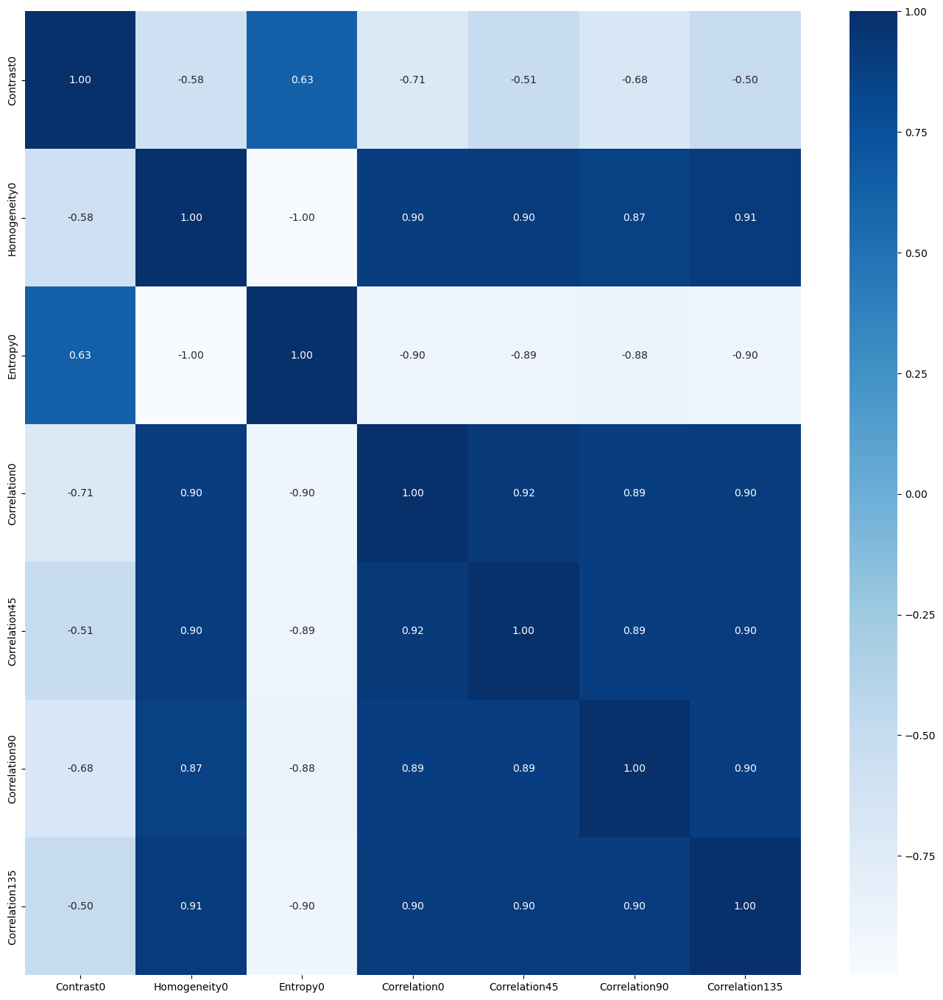

In [34]:
# Menghitung korelasi
correlation = hasilEkstrak.drop(columns=['Label','Filename']).corr()

# Menyaring fitur yang memiliki korelasi absolut lebih dari 0.95 dengan label
threshold = 0.95 # atur threshold ini untuk menentukan seberapa besar korelasi yang ingin disaring
selectionFeature = []
columns = np.full((correlation.shape[0],), True, dtype=bool)
for i in range(correlation.shape[0]):
	for j in range(i+1, correlation.shape[0]):
		if correlation.iloc[i,j] >= threshold:
			if columns[j]:
				columns[j] = False
select = hasilEkstrak.drop(columns=['Label','Filename']).columns[columns]
x_new = hasilEkstrak[select]
x_new
y = hasilEkstrak['Label']
plt.figure(figsize=(17,17))
sns.heatmap(x_new.corr(), annot=True, cmap='Blues', fmt=".2f")


In [35]:

# 0.3 = 30% data untuk testing (train/test 70/30)
# 0.2 = 20% data untuk testing (train/test 80/20)
X_train, X_test, y_train, y_test = train_test_split(x_new, y, test_size=0.2, random_state=42)
print(X_train.shape)
print(X_test.shape)


(240, 7)
(60, 7)


In [36]:

X_test = (X_test - X_train.mean()) / X_train.std()
X_train = (X_train - X_train.mean()) / X_train.std()

def generateClassificationReport(y_true, y_pred):
	print(classification_report(y_true, y_pred))
	print(confusion_matrix(y_true, y_pred))
	print('Accuracy:', accuracy_score(y_true, y_pred))

# Define classifiers
rf = RandomForestClassifier(n_estimators=5, random_state=42)
svm = SVC(kernel='rbf', random_state=42)
knn = KNeighborsClassifier(n_neighbors=5)


In [37]:

rf.fit(X_train, y_train)

# Make predictions and evaluate the model with the training set
print("------Training Set------")
y_pred = rf.predict(X_train)
generateClassificationReport( y_train, y_pred)

# Make predictions and evaluate the model with the testing set
print("\n------Testing Set------")
y_pred = rf.predict(X_test)
generateClassificationReport( y_test, y_pred)


------Training Set------
                                            precision    recall  f1-score   support

                         Grape___Black_rot       0.94      0.95      0.94        78
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)       0.95      0.96      0.96        78
                           Grape___healthy       0.98      0.95      0.96        84

                                  accuracy                           0.95       240
                                 macro avg       0.95      0.95      0.95       240
                              weighted avg       0.95      0.95      0.95       240

[[74  3  1]
 [ 2 75  1]
 [ 3  1 80]]
Accuracy: 0.9541666666666667

------Testing Set------
                                            precision    recall  f1-score   support

                         Grape___Black_rot       0.71      0.68      0.70        22
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)       0.75      0.82      0.78        22
                           Grape___healt

In [38]:

svm.fit(X_train, y_train)

# Make predictions and evaluate the model with the training set
print("\n------Training Set------")
y_pred = svm.predict(X_train)
generateClassificationReport( y_train, y_pred)

# Make predictions and evaluate the model with the testing set
print("\n------Testing Set------")
y_pred = svm.predict(X_test)
generateClassificationReport( y_test, y_pred)



------Training Set------
                                            precision    recall  f1-score   support

                         Grape___Black_rot       0.68      0.86      0.76        78
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)       0.82      0.77      0.79        78
                           Grape___healthy       0.90      0.74      0.81        84

                                  accuracy                           0.79       240
                                 macro avg       0.80      0.79      0.79       240
                              weighted avg       0.80      0.79      0.79       240

[[67  7  4]
 [15 60  3]
 [16  6 62]]
Accuracy: 0.7875

------Testing Set------
                                            precision    recall  f1-score   support

                         Grape___Black_rot       0.71      0.91      0.80        22
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)       0.91      0.91      0.91        22
                           Grape___healthy       0.

In [39]:

knn.fit(X_train, y_train)

# Make predictions and evaluate the model with the training set
print("\n------Training Set------")
y_pred = knn.predict(X_train)
generateClassificationReport( y_train, y_pred)

# Make predictions and evaluate the model with the testing set
print("\n------Testing Set------")
y_pred = knn.predict(X_test)
generateClassificationReport( y_test, y_pred)



------Training Set------
                                            precision    recall  f1-score   support

                         Grape___Black_rot       0.82      0.87      0.84        78
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)       0.83      0.87      0.85        78
                           Grape___healthy       0.91      0.81      0.86        84

                                  accuracy                           0.85       240
                                 macro avg       0.85      0.85      0.85       240
                              weighted avg       0.85      0.85      0.85       240

[[68  6  4]
 [ 7 68  3]
 [ 8  8 68]]
Accuracy: 0.85

------Testing Set------
                                            precision    recall  f1-score   support

                         Grape___Black_rot       0.82      0.64      0.72        22
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)       0.70      0.95      0.81        22
                           Grape___healthy       0.92

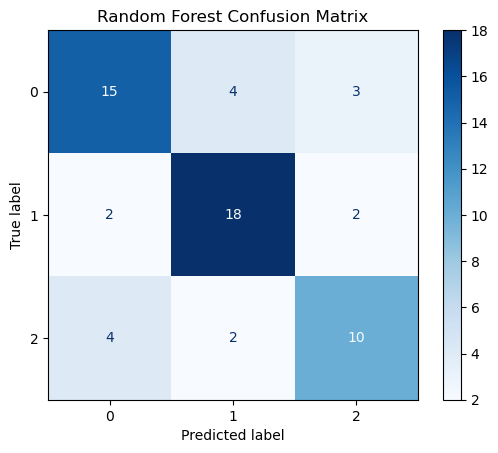

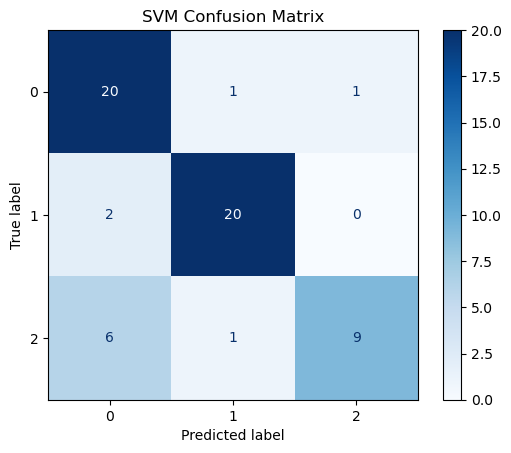

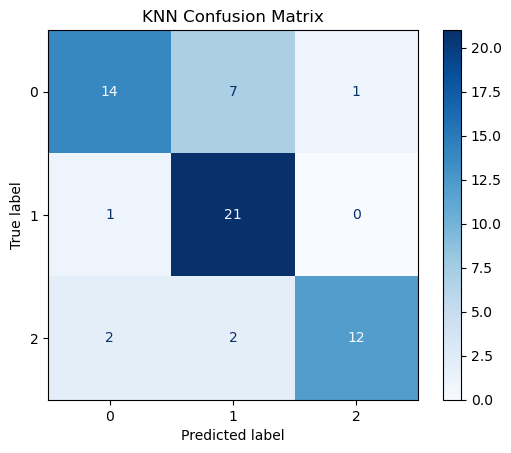

In [40]:


def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap=plt.cm.Blues)
    plt.title(title)
    plt.show()

# Plot confusion matrix for Random Forest
plot_confusion_matrix(y_test, rf.predict(X_test), "Random Forest Confusion Matrix")
# Plot confusion matrix for SVM
plot_confusion_matrix(y_test, svm.predict(X_test), "SVM Confusion Matrix")
# Plot confusion matrix for KNN
plot_confusion_matrix(y_test, knn.predict(X_test), "KNN Confusion Matrix")